In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import  HTML

import os
from itertools import product

In [11]:
# bulk generate
save_dir = 'data_model_outputs'
prefix_A = 'hh_A'
prefix_T = 'hh_T'
prefix_exp = 'hh_exp'
ending = '_.pkl.xz'

scenarios_dict = {}

path_scenarios = f'{save_dir}/experiment_scenarios_ref.pkl.xz'

for file_name in os.listdir(save_dir):
    # target = None
    if prefix_A in file_name:
        # find scenario name
        scenario = "_".join(file_name.split("_")[2:-1])
        scenarios_dict[scenario] = {
            "A": file_name,
            "T": f"{prefix_T}_{scenario}{ending}",
            "E": f"{prefix_exp}_{scenario}{ending}"
        }

C:\Users\fishe\AppData\Local\Temp/ipykernel_10160/2731966909.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig3, ax3 = plt.subplots(figsize=(8, 4))


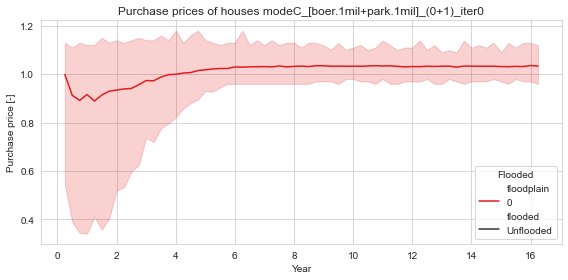

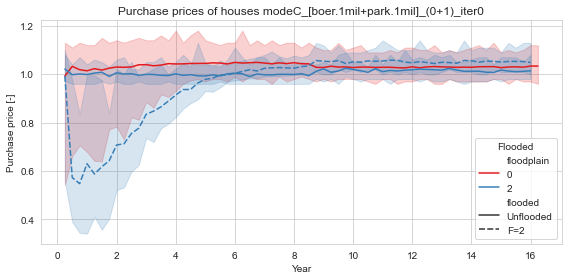

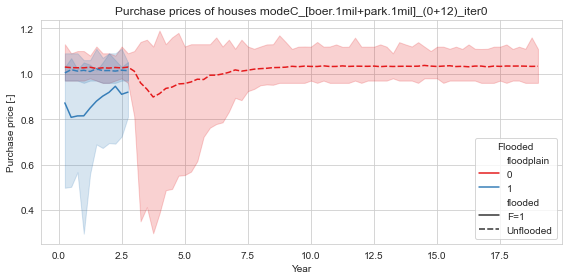

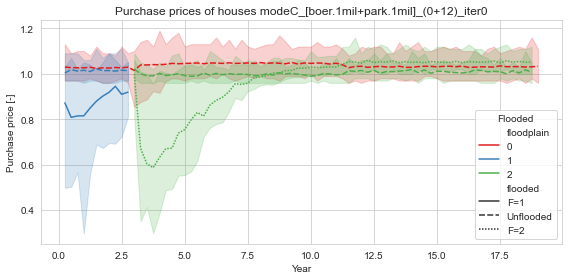

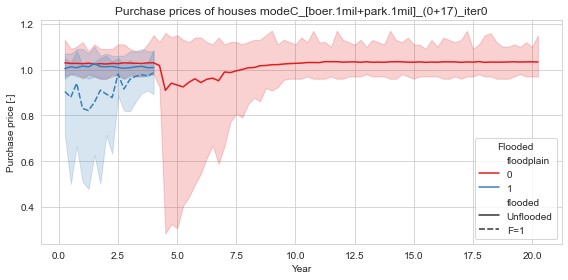

...

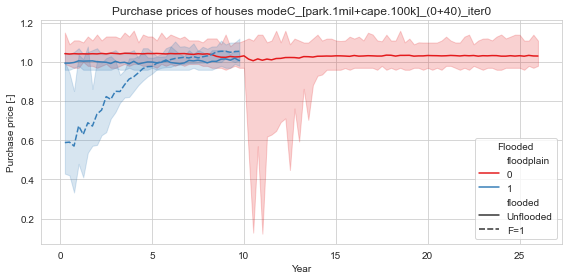

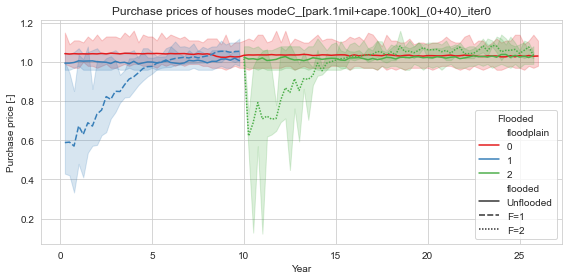

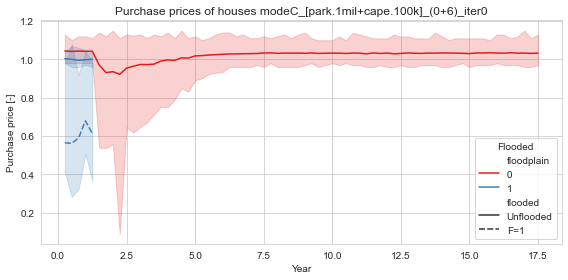

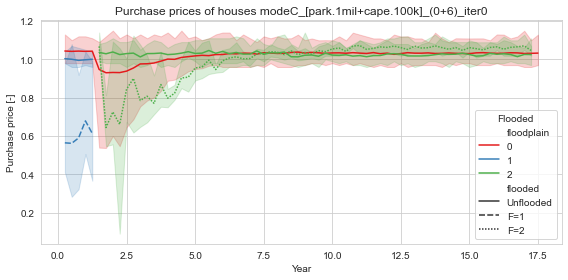

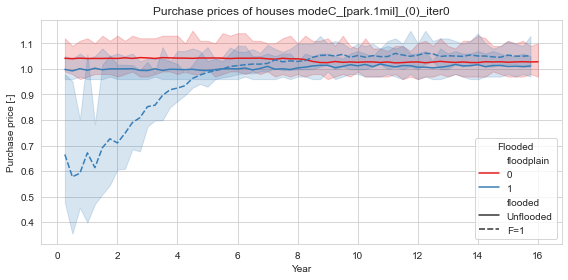

In [12]:
scenarios_ref_df = pd.read_pickle(path_scenarios)
plt.ioff()
for scenario, paths in scenarios_dict.items():
    path_A, path_T, path_exp = paths.values()
    all_df = pd.read_pickle(f"{save_dir}/{path_A}")
    transactions_df = pd.read_pickle(f"{save_dir}/{path_T}")
    exposures_df = pd.read_pickle(f"{save_dir}/{path_exp}")
    scenarios_info = scenarios_ref_df.loc[f"{scenario}_",:]

    # get all flooded homes
    all_flooded = all_df.loc[(1,slice(None)), 'fld_dmg'].droplevel('step',axis=0)
    all_flooded = all_flooded[all_flooded].index

    test_trans_df = transactions_df.copy(deep=True)
    test_trans_df['floodplain'] = 0
    test_trans_df['flooded'] = "Unflooded"
    test_trans_df.set_index(keys='district', append=True, inplace=True)

    flood_section_start = 0
    for fld_n in range(0, scenarios_info['n_flds']):
        affected = scenarios_info['affected'][fld_n]
        # think about time slicing
        try:
            flood_section_end = scenarios_info['timings'][fld_n + 1]
        except IndexError:
            # get the last time
            flood_section_end = test_trans_df.index.get_level_values('step').astype('int').max()

        # test = test_trans_df.loc[(range(flood_time,next_flood), slice(None),slice(None)), 'floodplain']
        steps = range(flood_section_start, flood_section_end)
        search_combis = list(product(steps, affected))  # itertools
        find1 = test_trans_df.loc[test_trans_df.index.droplevel('unique_id').isin(search_combis), :]
        find1_homes = find1.index.get_level_values('unique_id').categories
        intersect = list(set(all_flooded) & set(find1_homes))
        test_trans_df.loc[find1.index, 'floodplain'] = fld_n + 1
        # match the floodplain homes with flooded homes

        find2 = find1.loc[find1.index.isin(intersect, level=1), :]
        test_trans_df.loc[find2.index, 'flooded'] = f"F={fld_n + 1}"

        flood_section_start = flood_section_end

        fig3, ax3 = plt.subplots(figsize=(8, 4))
        test_trans_plot = test_trans_df.reset_index()
        test_trans_plot['step'] = test_trans_plot['step'].astype(int) / 4
        sns.lineplot(data=test_trans_plot, x='step', y='win_bid', hue='floodplain', style='flooded', palette='Set1',
                     errorbar=('pi', 100))
        plt.legend(loc='lower right', title='Flooded')
        plt.title(f'Purchase prices of houses {scenario}')
        plt.xlabel('Year')
        plt.ylabel('Purchase price [-]')
        plt.tight_layout()
        plt.savefig(f'data_model_outputs/outputs1/T_{scenario}.jpg', dpi=500)
        plt.close()



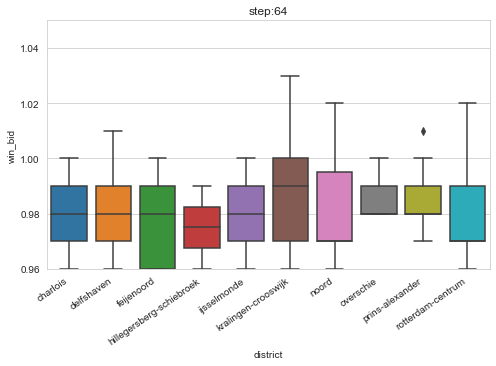

In [4]:
# raw = pd.read_pickle('data_model_outputs/trial_run_A_3k_r2.pickletable')
# name = 'hh_T_modeC_[boer.1mil]_(0)_iter0.pkl.xz'
# raw = pd.read_pickle(f'data_model_outputs/{name}')

# # need to sort according to step, location
# subset = raw.xs(1, level=0)
# index = raw.index.to_frame()
# idxmax, idxmin = raw.win_bid.min(), raw.win_bid.max()
# frames = index[0].unique().tolist()
# fig, ax = plt.subplots(figsize=(7, 5))
# ax.set_ylim(idxmax, idxmin)
#
# def update(index):
#     ax.cla()
#     data = raw.xs(index, level=0)
#     sns.boxplot(data=data, y='win_bid', x='district', orient='v', ax=ax)
#     ax.set_ylim(idxmax, idxmin)
#     ax.set_xticklabels(ax.get_xticklabels(),rotation=35, ha='right')
#     plt.tight_layout()
#     ax.set_title(f'step:{index}')
#
# # def data_gen():
# #     i = 1
# #     steps = index[0].max()
# #     while i < steps +1:
# #         yield raw.xs(i, level=0)
# #         i += 1
#
# anim = animation.FuncAnimation(fig, update, frames=frames, interval=200)
# HTML(anim.to_html5_video())
# plt.show()

In [5]:
# writervideo = animation.FFMpegWriter(fps=2,bitrate=900)
# anim.save(f"data_model_outputs/{name}.mp4", writer=writervideo,dpi=200)

<Figure size 432x288 with 0 Axes>